# "Traffic, Driving Style and Road Surface Condition" Dataset EDA

### Content
- [Data Preparation](#Data-Preparation)
- [Data Analysis](#Data-Analysis)
- [Conclusion](#Conclusion)

## Data Preparation

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [39]:
opelDf = pd.read_csv("DS1.csv",sep=";")
opelDf.merge(pd.read_csv("DS2.csv",sep=";"))
opelDf = opelDf.replace(',','.', regex=True)

,EngineCoolantTemperature,ManifoldAbsolutePressure,EngineRPM,IntakeAirTemperature
count,7392.000000,7392.00000,7392.000000,7392.000000
mean,77.000947,115.72619,1560.496753,16.522321
std,8.740838,20.37355,549.154886,4.947106
min,34.000000,97.00000,752.000000,7.000000
25%,78.000000,102.00000,929.750000,12.000000
50%,80.000000,108.00000,1647.000000,16.000000
75%,81.000000,121.00000,2024.250000,19.000000
max,85.000000,252.00000,3104.000000,38.000000


In [50]:
opelDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7392 entries, 0 to 7391
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   AltitudeVariation          7338 non-null   object
 1   VehicleSpeedInstantaneous  7385 non-null   object
 2   VehicleSpeedAverage        7038 non-null   object
 3   VehicleSpeedVariance       7038 non-null   object
 4   VehicleSpeedVariation      7358 non-null   object
 5   LongitudinalAcceleration   7392 non-null   object
 6   EngineLoad                 7392 non-null   object
 7   EngineCoolantTemperature   7392 non-null   int64 
 8   ManifoldAbsolutePressure   7392 non-null   int64 
 9   EngineRPM                  7392 non-null   int64 
 10  MassAirFlow                7392 non-null   object
 11  IntakeAirTemperature       7392 non-null   int64 
 12  VerticalAcceleration       7392 non-null   object
 13  FuelConsumptionAverage     7295 non-null   object
 14  roadSurf

In [51]:
peugeotDf = pd.read_csv("DS3.csv",sep=";")
peugeotDf.merge(pd.read_csv("DS4.csv",sep=";"))
peugeotDf = peugeotDf.replace(',','.', regex=True)

In [52]:
peugeotDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8614 entries, 0 to 8613
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   AltitudeVariation          8551 non-null   object 
 1   VehicleSpeedInstantaneous  8605 non-null   object 
 2   VehicleSpeedAverage        8199 non-null   object 
 3   VehicleSpeedVariance       8199 non-null   object 
 4   VehicleSpeedVariation      8536 non-null   object 
 5   LongitudinalAcceleration   8614 non-null   object 
 6   EngineLoad                 8609 non-null   object 
 7   EngineCoolantTemperature   8609 non-null   float64
 8   ManifoldAbsolutePressure   8609 non-null   float64
 9   EngineRPM                  8609 non-null   object 
 10  MassAirFlow                8609 non-null   object 
 11  IntakeAirTemperature       8609 non-null   float64
 12  VerticalAcceleration       8614 non-null   object 
 13  FuelConsumptionAverage     8518 non-null   objec

There are issues in the data types of all attributes but `roadSurface`, `traffic` and `drivingStyle` (Target) in both dataframes

In [63]:
opelDf = opelDf.astype({'AltitudeVariation':np.float64, 
                        'VehicleSpeedInstantaneous':np.float64,
                        'VehicleSpeedAverage':np.float64,
                        'VehicleSpeedVariance':np.float64,
                        'VehicleSpeedVariation':np.float64,
                        'LongitudinalAcceleration':np.float64,
                        'EngineLoad':np.float64,
                        'EngineRPM':np.float64,
                        'MassAirFlow':np.float64,
                        'VerticalAcceleration':np.float64,
                        'FuelConsumptionAverage':np.float64,
                       })
peugeotDf = peugeotDf.astype({'AltitudeVariation':np.float64, 
                        'VehicleSpeedInstantaneous':np.float64,
                        'VehicleSpeedAverage':np.float64,
                        'VehicleSpeedVariance':np.float64,
                        'VehicleSpeedVariation':np.float64,
                        'LongitudinalAcceleration':np.float64,
                        'EngineLoad':np.float64,
                        'EngineRPM':np.float64,
                        'MassAirFlow':np.float64,
                        'VerticalAcceleration':np.float64,
                        'FuelConsumptionAverage':np.float64,
                       })

In [64]:
opelDf.describe()

,AltitudeVariation,VehicleSpeedInstantaneous,VehicleSpeedAverage,VehicleSpeedVariance,VehicleSpeedVariation,LongitudinalAcceleration,EngineLoad,EngineCoolantTemperature,ManifoldAbsolutePressure,EngineRPM,MassAirFlow,IntakeAirTemperature,VerticalAcceleration,FuelConsumptionAverage
count,7338.000000,7385.000000,7038.000000,7038.000000,7358.000000,7392.000000,7392.000000,7392.000000,7392.00000,7392.000000,7392.000000,7392.000000,7392.000000,7295.000000
mean,-0.733865,35.474188,36.723932,213.004353,-0.000612,0.127419,26.765025,77.000947,115.72619,1560.496753,16.196446,16.522321,0.060608,15.921659
std,2.613089,32.520449,29.366391,205.717663,2.390854,0.736110,19.454573,8.740838,20.37355,549.154886,9.360109,4.947106,0.374774,5.710125
min,-42.700012,0.000000,0.000000,0.000000,-17.789218,-2.380000,0.000000,34.000000,97.00000,752.000000,4.010000,7.000000,-1.246000,7.271883
25%,-1.500000,8.106480,16.698035,54.333652,-0.900721,-0.348000,14.117647,78.000000,102.00000,929.750000,8.080000,12.000000,-0.207000,12.529775
50%,-0.300049,27.922319,28.312631,144.864363,0.000000,0.109400,25.490196,80.000000,108.00000,1647.000000,15.140000,16.000000,0.074200,15.383096
75%,0.100037,52.692120,47.595544,299.377339,0.900723,0.652000,35.294117,81.000000,121.00000,2024.250000,21.389999,19.000000,0.312500,18.810178
max,22.400024,124.749725,121.330733,1051.789888,12.384899,2.360000,100.000000,85.000000,252.00000,3104.000000,73.250000,38.000000,1.210000,178.876450


In [65]:
peugeotDf.describe()

,AltitudeVariation,VehicleSpeedInstantaneous,VehicleSpeedAverage,VehicleSpeedVariance,VehicleSpeedVariation,LongitudinalAcceleration,EngineLoad,EngineCoolantTemperature,ManifoldAbsolutePressure,EngineRPM,MassAirFlow,IntakeAirTemperature,VerticalAcceleration,FuelConsumptionAverage
count,8551.000000,8605.000000,8199.000000,8199.000000,8.536000e+03,8614.000000,8609.000000,8609.000000,8609.000000,8609.000000,8609.000000,8609.000000,8614.000000,8518.000000
mean,-0.349152,45.132933,46.889535,159.545051,-2.108742e-12,1.095666,45.146371,65.893367,114.627134,1498.467302,16.767896,32.824951,-0.630586,14.841201
std,3.404353,35.858795,33.502960,188.542234,2.749580e+00,0.765349,30.310476,19.963763,16.177559,608.348232,9.066968,12.330492,0.638336,14.038828
min,-59.300003,0.000000,0.000000,0.000000,-1.035000e+02,-1.457600,0.000000,8.000000,88.000000,0.000000,0.880000,7.000000,-2.763100,7.847495
25%,-1.400002,16.199999,19.582499,41.323268,-8.999996e-01,0.532525,24.313726,51.000000,103.000000,854.000000,7.520000,21.000000,-1.032875,10.160812
50%,-0.100006,36.899998,35.954999,103.799893,0.000000e+00,1.126050,40.392159,79.000000,106.000000,1470.000000,16.879999,35.000000,-0.627400,13.111875
75%,1.000000,70.199997,75.337498,202.930619,9.000015e-01,1.626925,75.686279,79.000000,124.000000,1918.000000,24.160000,41.000000,-0.165825,15.076202
max,56.099998,119.699997,114.884996,1418.370369,9.720000e+01,3.979800,100.000000,86.000000,170.000000,2802.500000,38.549999,65.000000,0.999900,180.034760


In [110]:
all_cars_df = opelDf
all_cars_df.merge(peugeotDf)

,AltitudeVariation,VehicleSpeedInstantaneous,VehicleSpeedAverage,VehicleSpeedVariance,VehicleSpeedVariation,LongitudinalAcceleration,EngineLoad,EngineCoolantTemperature,ManifoldAbsolutePressure,EngineRPM,MassAirFlow,IntakeAirTemperature,VerticalAcceleration,FuelConsumptionAverage,roadSurface,traffic,drivingStyle


In [111]:
all_cars_df.shape

(7392, 17)

In [112]:
all_cars_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7392 entries, 0 to 7391
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   AltitudeVariation          7338 non-null   float64
 1   VehicleSpeedInstantaneous  7385 non-null   float64
 2   VehicleSpeedAverage        7038 non-null   float64
 3   VehicleSpeedVariance       7038 non-null   float64
 4   VehicleSpeedVariation      7358 non-null   float64
 5   LongitudinalAcceleration   7392 non-null   float64
 6   EngineLoad                 7392 non-null   float64
 7   EngineCoolantTemperature   7392 non-null   int64  
 8   ManifoldAbsolutePressure   7392 non-null   int64  
 9   EngineRPM                  7392 non-null   float64
 10  MassAirFlow                7392 non-null   float64
 11  IntakeAirTemperature       7392 non-null   int64  
 12  VerticalAcceleration       7392 non-null   float64
 13  FuelConsumptionAverage     7295 non-null   float

In [113]:
all_cars_df.describe()

,AltitudeVariation,VehicleSpeedInstantaneous,VehicleSpeedAverage,VehicleSpeedVariance,VehicleSpeedVariation,LongitudinalAcceleration,EngineLoad,EngineCoolantTemperature,ManifoldAbsolutePressure,EngineRPM,MassAirFlow,IntakeAirTemperature,VerticalAcceleration,FuelConsumptionAverage
count,7338.000000,7385.000000,7038.000000,7038.000000,7358.000000,7392.000000,7392.000000,7392.000000,7392.00000,7392.000000,7392.000000,7392.000000,7392.000000,7295.000000
mean,-0.733865,35.474188,36.723932,213.004353,-0.000612,0.127419,26.765025,77.000947,115.72619,1560.496753,16.196446,16.522321,0.060608,15.921659
std,2.613089,32.520449,29.366391,205.717663,2.390854,0.736110,19.454573,8.740838,20.37355,549.154886,9.360109,4.947106,0.374774,5.710125
min,-42.700012,0.000000,0.000000,0.000000,-17.789218,-2.380000,0.000000,34.000000,97.00000,752.000000,4.010000,7.000000,-1.246000,7.271883
25%,-1.500000,8.106480,16.698035,54.333652,-0.900721,-0.348000,14.117647,78.000000,102.00000,929.750000,8.080000,12.000000,-0.207000,12.529775
50%,-0.300049,27.922319,28.312631,144.864363,0.000000,0.109400,25.490196,80.000000,108.00000,1647.000000,15.140000,16.000000,0.074200,15.383096
75%,0.100037,52.692120,47.595544,299.377339,0.900723,0.652000,35.294117,81.000000,121.00000,2024.250000,21.389999,19.000000,0.312500,18.810178
max,22.400024,124.749725,121.330733,1051.789888,12.384899,2.360000,100.000000,85.000000,252.00000,3104.000000,73.250000,38.000000,1.210000,178.876450


### Data Wrangling

In [115]:
all_cars_df["AltitudeVariation"].fillna(all_cars_df["AltitudeVariation"].median(), inplace= True)
all_cars_df["VehicleSpeedInstantaneous"].fillna(all_cars_df["VehicleSpeedInstantaneous"].median(), inplace= True)
all_cars_df["VehicleSpeedAverage"].fillna(all_cars_df["VehicleSpeedAverage"].mean(), inplace= True)
all_cars_df["VehicleSpeedVariance"].fillna(all_cars_df["VehicleSpeedVariance"].median(), inplace= True)
all_cars_df["VehicleSpeedVariation"].fillna(all_cars_df["VehicleSpeedVariation"].median(), inplace= True)
all_cars_df["FuelConsumptionAverage"].fillna(all_cars_df["FuelConsumptionAverage"].mean(), inplace= True)
all_cars_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7392 entries, 0 to 7391
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   AltitudeVariation          7392 non-null   float64
 1   VehicleSpeedInstantaneous  7392 non-null   float64
 2   VehicleSpeedAverage        7392 non-null   float64
 3   VehicleSpeedVariance       7392 non-null   float64
 4   VehicleSpeedVariation      7392 non-null   float64
 5   LongitudinalAcceleration   7392 non-null   float64
 6   EngineLoad                 7392 non-null   float64
 7   EngineCoolantTemperature   7392 non-null   int64  
 8   ManifoldAbsolutePressure   7392 non-null   int64  
 9   EngineRPM                  7392 non-null   float64
 10  MassAirFlow                7392 non-null   float64
 11  IntakeAirTemperature       7392 non-null   int64  
 12  VerticalAcceleration       7392 non-null   float64
 13  FuelConsumptionAverage     7392 non-null   float

## Data Analysis

In [116]:
all_cars_df[["traffic","roadSurface","drivingStyle"]].nunique()

traffic         3
roadSurface     2
drivingStyle    2
dtype: int64

In [117]:
all_cars_df["traffic"].value_counts()

LowCongestionCondition       6815
HighCongestionCondition       449
NormalCongestionCondition     128
Name: traffic, dtype: int64

In [118]:
all_cars_df["drivingStyle"].value_counts()

EvenPaceStyle      6042
AggressiveStyle    1350
Name: drivingStyle, dtype: int64

In [119]:
all_cars_df["roadSurface"].value_counts()

SmoothCondition    7227
UnevenCondition     165
Name: roadSurface, dtype: int64

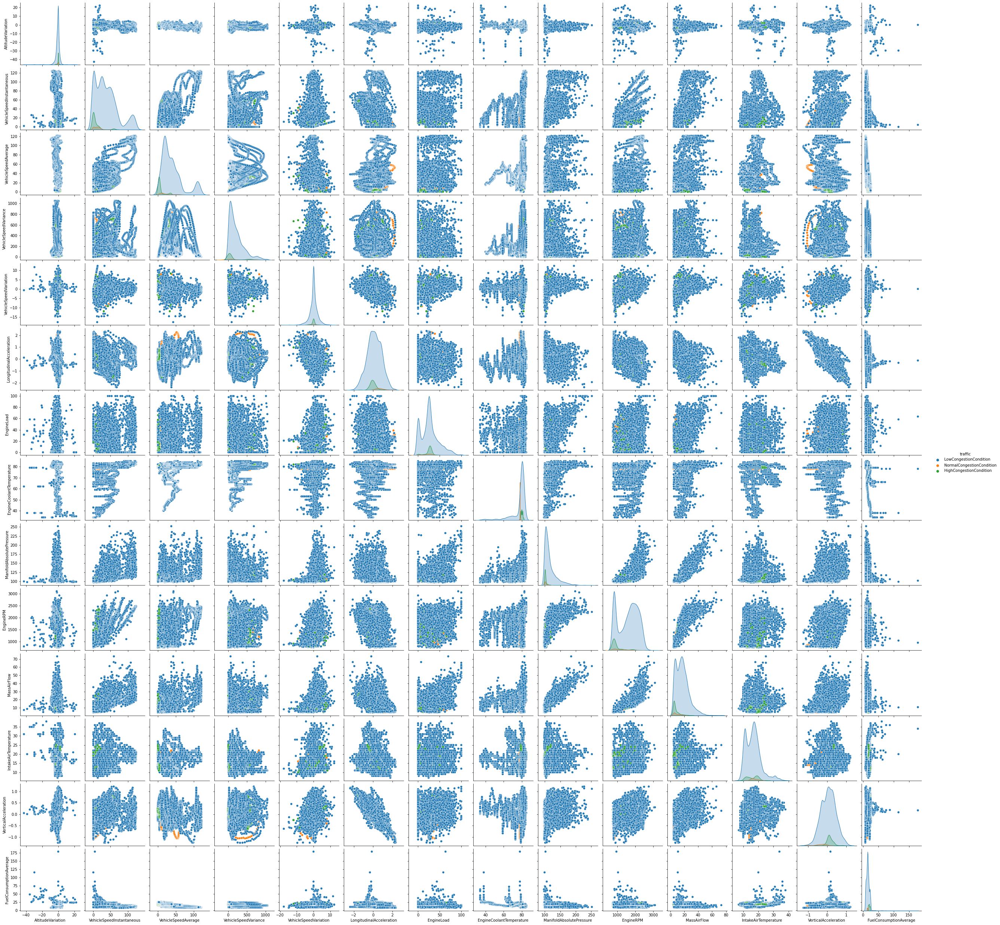

In [75]:
sns.pairplot(all_cars_df, hue="traffic")

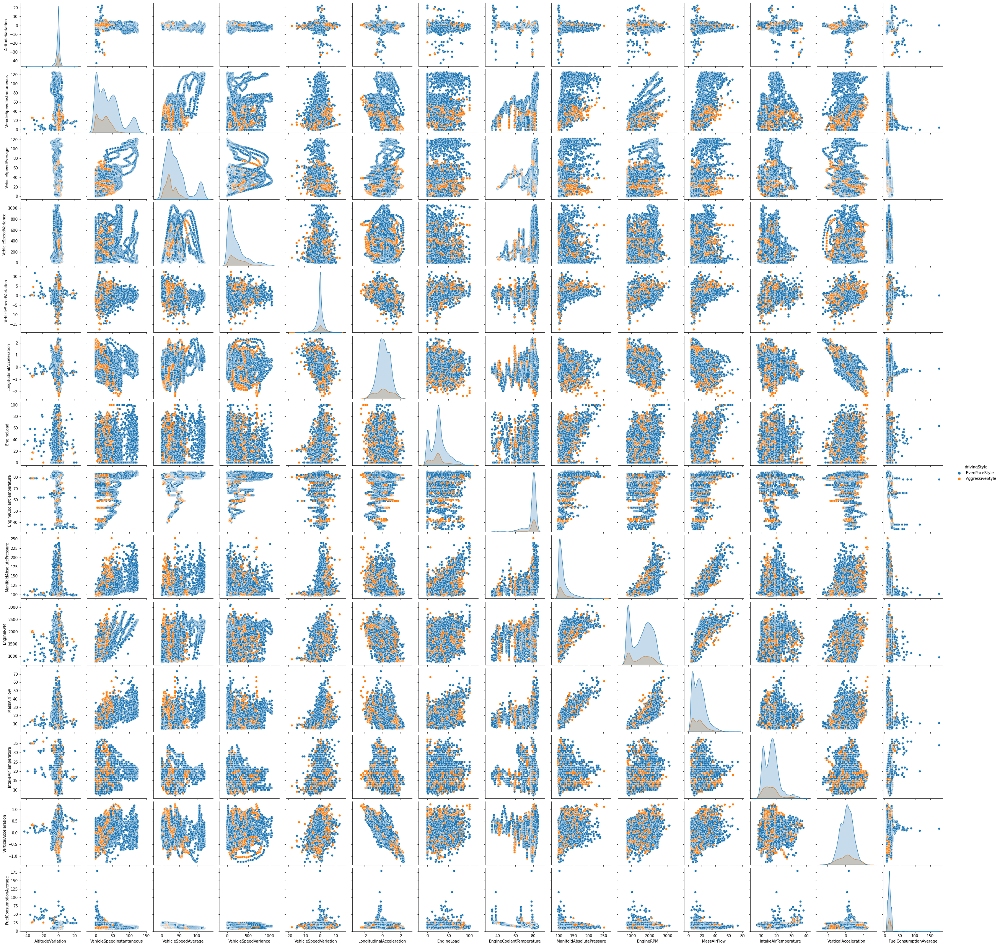

In [82]:
sns.pairplot(all_cars_df, hue="drivingStyle")

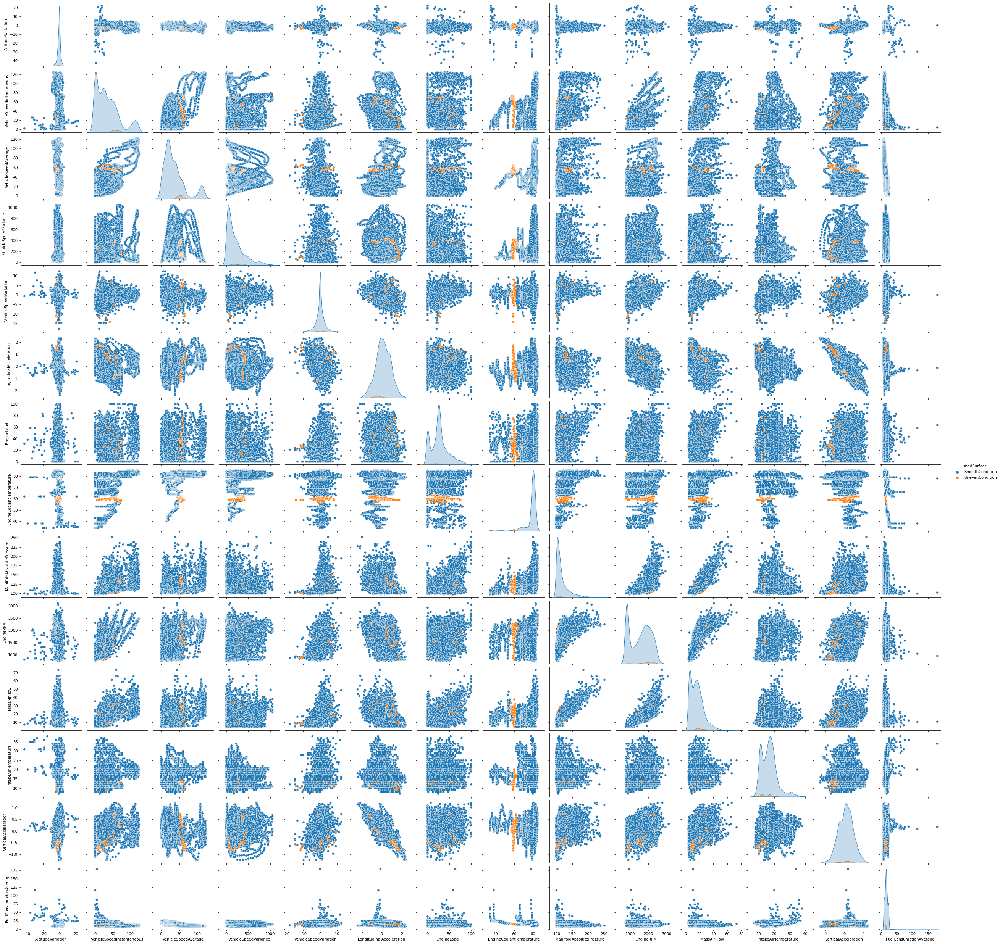

In [83]:
sns.pairplot(all_cars_df, hue="roadSurface")

Summary of all correlations between attributes

<AxesSubplot:>

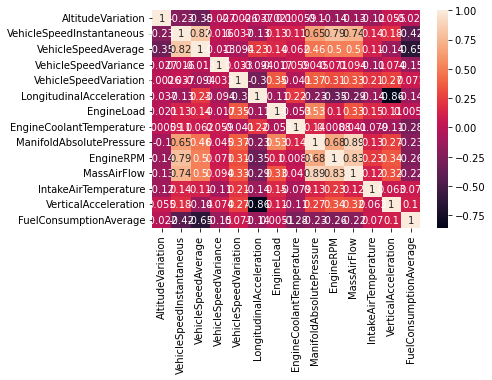

In [84]:
sns.heatmap(all_cars_df.corr(), annot=True)

## Conclusion

This dataset explores multiple attributes of 2 different vehicle types and their relation to `traffic` (low, mid or high), `drivingStyle` (aggresive or normal) and `roadSurface` (even or uneven). It is an interesting dataset since it can be used to predict these mentioned 3 targets contributing to safer transportation since these metrics can be used to warn drivers in real time of surrounding dangers and alert the user of their own driving style

### Pros:
- Large dataset
- Multiple relevant parameters with low intercorrelation
- Multiple target values

### Cons:
- Tested with only 2 vehicles
- Low number of `aggressive behaviour`, `uneven road` and `normal congestion` inputs